In [0]:
!apt-get install libgeos-3.5.0
!apt-get install libgeos-dev
!pip install https://github.com/matplotlib/basemap/archive/master.zip

Reading package lists... Done
Building dependency tree       
Reading state information... Done
E: Unable to locate package libgeos-3.5.0
E: Couldn't find any package by glob 'libgeos-3.5.0'
E: Couldn't find any package by regex 'libgeos-3.5.0'
Reading package lists... Done
Building dependency tree       
Reading state information... Done
libgeos-dev is already the newest version (3.6.2-1build2).
0 upgraded, 0 newly installed, 0 to remove and 25 not upgraded.
  Using cached https://github.com/matplotlib/basemap/archive/master.zip
  Created wheel for basemap: filename=basemap-1.2.1-cp36-cp36m-linux_x86_64.whl size=121756027 sha256=0c55f0ad506d173745ae3dcbb3321252ec7d9fb705e3f020291571a06b7d5b56
  Stored in directory: /tmp/pip-ephem-wheel-cache-3vhgpryh/wheels/98/4a/fc/ce719b75d97e646645c225f3332b1b217536100314922e9572
Successfully built basemap


In [0]:
!pip install pyproj==1.9.6

In [0]:
import matplotlib.pyplot as plt
import pandas as pd
from itertools import groupby

import matplotlib.cm

from mpl_toolkits.basemap import Basemap

from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection
from matplotlib.colors import Normalize
import numpy as np

import scipy.special
import random
import imageio

from mpl_toolkits.mplot3d import Axes3D  
from random import seed
from random import random
from scipy.stats import beta

In [0]:
data1 = pd.read_csv("https://raw.githubusercontent.com/Vaibhav911/Rainfall-Pattern-Analysis/master/Sub_Division_IMD_2017.csv")
data1


,SUBDIVISION,YEAR,JAN,FEB,MAR,APR,MAY,JUN,JUL,AUG,SEP,OCT,NOV,DEC,ANNUAL,JF,MAM,JJAS,OND
0,Andaman & Nicobar Islands,1901,49.2,87.1,29.2,2.3,528.8,517.5,365.1,481.1,332.6,388.5,558.2,33.6,3373.2,136.3,560.3,1696.3,980.3
1,Andaman & Nicobar Islands,1902,0.0,159.8,12.2,0.0,446.1,537.1,228.9,753.7,666.2,197.2,359.0,160.5,3520.7,159.8,458.3,2185.9,716.7
2,Andaman & Nicobar Islands,1903,12.7,144.0,0.0,1.0,235.1,479.9,728.4,326.7,339.0,181.2,284.4,225.0,2957.4,156.7,236.1,1874.0,690.6
3,Andaman & Nicobar Islands,1904,9.4,14.7,0.0,202.4,304.5,495.1,502.0,160.1,820.4,222.2,308.7,40.1,3079.6,24.1,506.9,1977.6,571.0
4,Andaman & Nicobar Islands,1905,1.3,0.0,3.3,26.9,279.5,628.7,368.7,330.5,297.0,260.7,25.4,344.7,2566.7,1.3,309.7,1624.9,630.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4183,Lakshadweep,2013,26.2,34.4,37.5,5.3,88.3,426.2,296.4,154.4,180.0,72.8,78.1,26.7,1426.3,60.6,131.1,1057.0,177.6
4184,Lakshadweep,2014,53.2,16.1,4.4,14.9,57.4,244.1,116.1,466.1,132.2,169.2,59.0,62.3,1395.0,69.3,76.7,958.5,290.5
4185,Lakshadweep,2015,2.2,0.5,3.7,87.1,133.1,296.6,257.5,146.4,160.4,165.4,231.0,159.0,1642.9,2.7,223.9,860.9,555.4
4186,Lakshadweep,2016,59.6,12.1,3.2,2.6,77.4,321.1,262.6,86.2,75.6,58.6,32.0,74.7,1065.7,71.7,83.2,745.4,165.4


In [0]:
subdivs = data1.SUBDIVISION.unique()
print(subdivs)  #All unique subdivision in data

['Andaman & Nicobar Islands' 'Arunachal Pradesh' 'Assam & Meghalaya'
 'Naga Mani Mizo Tripura' 'Sub Himalayan West Bengal & Sikkim'
 'Gangetic West Bengal' 'Orissa' 'Jharkhand' 'Bihar' 'East Uttar Pradesh'
 'West Uttar Pradesh' 'Uttarakhand' 'Haryana Delhi & Chandigarh' 'Punjab'
 'Himachal Pradesh' 'Jammu & Kashmir' 'West Rajasthan' 'East Rajasthan'
 'West Madhya Pradesh' 'East Madhya Pradesh' 'Gujarat Region'
 'Saurashtra & Kutch' 'Konkan & Goa' 'Madhya Maharashtra' 'Matathwada'
 'Vidarbha' 'Chhattisgarh' 'Coastal Andhra Pradesh' 'Telangana'
 'Rayalseema' 'Tamil Nadu' 'Coastal Karnataka' 'North Interior Karnataka'
 'South Interior Karnataka' 'Kerala' 'Lakshadweep']


In [0]:
data_median = {} #dictionary to store median of each region
for div in subdivs:
  region_median = []
  for month in data1.columns[2:]:
    region_median.append(round(data1[data1["SUBDIVISION"] == div][month].median(), 2)) #doing round off till 2 digits
  data_median[div] = region_median

#show median distribution
pd.DataFrame(data_median)

,Andaman & Nicobar Islands,Arunachal Pradesh,Assam & Meghalaya,Naga Mani Mizo Tripura,Sub Himalayan West Bengal & Sikkim,Gangetic West Bengal,Orissa,Jharkhand,Bihar,East Uttar Pradesh,West Uttar Pradesh,Uttarakhand,Haryana Delhi & Chandigarh,Punjab,Himachal Pradesh,Jammu & Kashmir,West Rajasthan,East Rajasthan,West Madhya Pradesh,East Madhya Pradesh,Gujarat Region,Saurashtra & Kutch,Konkan & Goa,Madhya Maharashtra,Matathwada,Vidarbha,Chhattisgarh,Coastal Andhra Pradesh,Telangana,Rayalseema,Tamil Nadu,Coastal Karnataka,North Interior Karnataka,South Interior Karnataka,Kerala,Lakshadweep
0,32.10,38.90,12.8,7.9,9.4,6.8,5.4,9.5,9.3,11.7,14.2,49.4,14.3,21.6,78.0,90.40,1.6,3.6,4.80,12.8,0.1,0.1,0.0,0.6,0.7,3.7,6.3,2.0,1.0,2.1,10.0,0.15,0.2,0.8,6.0,13.80
1,12.65,85.15,28.3,30.0,19.6,13.6,12.1,16.1,8.2,8.7,10.4,58.6,11.5,21.0,82.1,102.70,1.3,2.2,2.65,11.2,0.0,0.0,0.0,0.2,0.7,4.8,10.7,5.1,3.3,0.9,5.4,0.00,0.3,1.1,8.4,4.10
2,12.15,139.90,75.7,62.7,42.6,18.9,12.7,11.1,6.5,4.1,5.7,46.8,7.2,15.8,83.6,116.00,1.2,1.4,2.00,8.0,0.0,0.0,0.1,1.5,2.7,5.2,7.9,5.7,4.7,4.0,11.9,1.50,4.0,5.2,28.3,5.30
3,54.80,246.90,198.6,161.7,110.9,38.7,28.2,15.6,12.6,3.7,2.9,30.7,2.8,6.7,55.9,86.80,1.4,1.0,1.30,3.1,0.0,0.0,1.2,6.2,4.4,5.6,11.7,20.8,14.0,12.3,36.0,24.70,22.1,39.8,108.4,32.15
4,317.30,306.90,325.7,278.5,268.8,99.6,57.7,42.4,46.3,14.5,8.2,51.0,8.0,9.6,54.3,61.10,6.1,5.7,3.60,5.2,0.9,0.5,9.7,15.2,7.7,6.4,15.5,44.4,21.3,41.4,61.3,80.80,43.2,91.0,190.6,145.85
5,450.25,530.55,509.8,442.6,527.8,226.3,199.4,182.4,163.2,98.2,67.2,141.3,43.7,41.8,85.5,60.00,22.3,53.4,100.50,118.5,112.5,62.1,728.0,146.4,132.2,156.4,184.3,116.9,133.9,57.7,49.8,818.60,101.3,135.9,625.8,326.15
6,379.50,609.35,474.5,430.0,657.7,313.4,341.5,334.9,322.9,284.4,240.8,395.1,139.6,164.8,273.8,163.75,90.5,227.8,305.60,366.8,316.4,168.4,1095.3,248.9,174.8,335.1,393.8,166.3,243.4,87.4,64.9,1102.90,134.9,225.7,687.3,271.50
7,376.40,400.00,400.7,392.8,500.9,292.6,348.8,331.7,292.8,262.6,241.3,384.5,142.3,145.8,256.5,176.40,76.1,223.1,284.00,364.4,230.3,96.1,670.9,187.0,150.4,282.4,395.6,176.1,196.8,98.5,91.3,651.20,117.9,171.2,385.2,198.10
8,428.80,383.70,299.1,309.8,408.4,229.5,237.0,217.6,217.9,177.5,131.7,182.7,67.3,58.8,113.1,65.00,23.4,88.0,151.40,180.8,129.2,55.9,340.7,161.4,163.4,173.0,211.4,169.8,162.3,131.5,114.0,274.10,146.2,138.4,223.9,156.00
9,276.35,172.70,144.1,167.8,128.7,95.9,92.2,55.9,43.1,20.7,9.6,18.8,3.8,3.7,15.6,23.00,1.1,4.7,13.60,23.6,7.1,2.9,90.3,57.8,47.8,37.8,59.7,178.6,62.5,124.4,165.2,178.70,86.5,132.9,282.6,154.30


In [0]:
data1 = pd.read_csv('Sub_Division_IMD_2017.csv')
count = 0
month_num = 0
for index, row in data1.iterrows():
  month_num = 0
  for month in data1.columns[2:]:
    if pd.isnull(data1.iloc[index][month]):
      data1.at[index, month] = data_median[row['SUBDIVISION']][month_num]
    month_num += 1

# printing data with missing values filled as median
data1

FileNotFoundError: ignored

In [0]:
#changing name of A &n
data1['SUBDIVISION'].replace('Andaman & Nicobar Islands', 'Andaman and Nicobar Islands',inplace=True)
#change from assa to assam
data1['SUBDIVISION'].replace('Assam & Meghalaya', 'Assam',inplace=True)


In [0]:
haha=data1.loc[data1['SUBDIVISION'] == 'Assam'].copy()
haha['SUBDIVISION'].replace('Assam', 'Meghalaya',inplace=True)
data1=data1.append(haha)

In [0]:
data1['SUBDIVISION'].replace('Naga Mani Mizo Tripura', 'Tripura',inplace=True)
data1['SUBDIVISION'].replace('Sub Himalayan West Bengal & Sikkim', 'Sikkim',inplace=True)
data1['SUBDIVISION'].replace('Gangetic West Bengal', 'West Bengal',inplace=True)

In [0]:
data1['SUBDIVISION'].replace('Haryana Delhi & Chandigarh', 'Haryana',inplace=True)

In [0]:
haha=data1.loc[data1['SUBDIVISION'] == 'Haryana'].copy()
haha['SUBDIVISION'].replace('Haryana', 'Delhi',inplace=True)
data1=data1.append(haha)

In [0]:
haha=data1.loc[data1['SUBDIVISION'] == 'Haryana'].copy()
haha['SUBDIVISION'].replace('Haryana', 'Chandigarh',inplace=True)
data1=data1.append(haha)

In [0]:
data1['SUBDIVISION'].replace('Jammu & Kashmir', 'Jammu and Kashmir',inplace=True)

In [0]:
data1['SUBDIVISION'].replace('Konkan & Goa', 'Goa',inplace=True)

In [0]:
data1['SUBDIVISION'].unique()

array(['Andaman & Nicobar Islands', 'Arunachal Pradesh',
       'Assam & Meghalaya', 'Naga Mani Mizo Tripura',
       'Sub Himalayan West Bengal & Sikkim', 'Gangetic West Bengal',
       'Orissa', 'Jharkhand', 'Bihar', 'East Uttar Pradesh',
       'West Uttar Pradesh', 'Uttarakhand', 'Haryana Delhi & Chandigarh',
       'Punjab', 'Himachal Pradesh', 'Jammu and Kashmir',
       'West Rajasthan', 'East Rajasthan', 'West Madhya Pradesh',
       'East Madhya Pradesh', 'Gujarat Region', 'Saurashtra & Kutch',
       'Goa', 'Madhya Maharashtra', 'Matathwada', 'Vidarbha',
       'Chhattisgarh', 'Coastal Andhra Pradesh', 'Telangana',
       'Rayalseema', 'Tamil Nadu', 'Coastal Karnataka',
       'North Interior Karnataka', 'South Interior Karnataka', 'Kerala',
       'Lakshadweep'], dtype=object)

In [0]:
haha=data1[data1['SUBDIVISION']=='East Uttar Pradesh' ]
haha=haha.groupby('YEAR').sum()

haha1=data1[data1['SUBDIVISION']=='West Uttar Pradesh' ]
haha1=haha1.groupby('YEAR').sum()
for i in haha.index:
  for j in haha.columns:
    haha1.loc[i,j]+=haha.loc[i,j]
haha1['YEAR'] = haha1.index
haha1['SUBDIVISION']='Uttar Pradesh'
data1=data1.append(haha1)
data1 = data1[data1['SUBDIVISION'] != 'East Uttar Pradesh']
data1 = data1[data1['SUBDIVISION'] != 'West Uttar Pradesh']


In [0]:
haha=data1[data1['SUBDIVISION']=='East Rajasthan' ]
haha=haha.groupby('YEAR').sum()

haha1=data1[data1['SUBDIVISION']=='West Rajasthan' ]
haha1=haha1.groupby('YEAR').sum()
for i in haha.index:
  for j in haha.columns:
    haha1.loc[i,j]+=haha.loc[i,j]
haha1['YEAR'] = haha1.index
haha1['SUBDIVISION']='Rajasthan'
data1=data1.append(haha1)
data1 = data1[data1['SUBDIVISION'] != 'East Rajasthan']
data1 = data1[data1['SUBDIVISION'] != 'West Rajasthan']

In [0]:
haha=data1[data1['SUBDIVISION']=='East Madhya Pradesh' ]
haha=haha.groupby('YEAR').sum()

haha1=data1[data1['SUBDIVISION']=='West Madhya Pradesh' ]
haha1=haha1.groupby('YEAR').sum()
for i in haha.index:
  for j in haha.columns:
    haha1.loc[i,j]+=haha.loc[i,j]
haha1['YEAR'] = haha1.index
haha1['SUBDIVISION']='Madhya Pradesh'
data1=data1.append(haha1)
data1 = data1[data1['SUBDIVISION'] != 'East Madhya Pradesh']
data1 = data1[data1['SUBDIVISION'] != 'West Madhya Pradesh']

In [0]:
haha=data1[data1['SUBDIVISION']=='Gujarat Region' ]
haha=haha.groupby('YEAR').sum()

haha1=data1[data1['SUBDIVISION']=='Saurashtra & Kutch' ]
haha1=haha1.groupby('YEAR').sum()
for i in haha.index:
  for j in haha.columns:
    haha1.loc[i,j]+=haha.loc[i,j]
haha1['YEAR'] = haha1.index
haha1['SUBDIVISION']='Gujarat'
data1=data1.append(haha1)
data1 = data1[data1['SUBDIVISION'] != 'Gujarat Region']
data1 = data1[data1['SUBDIVISION'] != 'Saurashtra & Kutch']

In [0]:
haha=data1[data1['SUBDIVISION']=='Madhya Maharashtra' ]
haha=haha.groupby('YEAR').sum()

haha1=data1[data1['SUBDIVISION']=='Matathwada' ]
haha1=haha1.groupby('YEAR').sum()
for i in haha.index:
  for j in haha.columns:
    haha1.loc[i,j]+=haha.loc[i,j]

haha=data1[data1['SUBDIVISION']=='Vidarbha' ]
haha=haha.groupby('YEAR').sum()
for i in haha.index:
  for j in haha.columns:
    haha1.loc[i,j]+=haha.loc[i,j]
haha1['YEAR'] = haha1.index
haha1['SUBDIVISION']='Maharashtra'
data1=data1.append(haha1)
data1 = data1[data1['SUBDIVISION'] != 'Vidarbha']
data1 = data1[data1['SUBDIVISION'] != 'Matathwada']
data1 = data1[data1['SUBDIVISION'] != 'Madhya Maharashtra']


In [0]:
haha=data1[data1['SUBDIVISION']=='Coastal Andhra Pradesh' ]
haha=haha.groupby('YEAR').sum()

haha1=data1[data1['SUBDIVISION']=='Telangana' ]
haha1=haha1.groupby('YEAR').sum()
for i in haha.index:
  for j in haha.columns:
    haha1.loc[i,j]+=haha.loc[i,j]

haha=data1[data1['SUBDIVISION']=='Rayalseema' ]
haha=haha.groupby('YEAR').sum()
for i in haha.index:
  for j in haha.columns:
    haha1.loc[i,j]+=haha.loc[i,j]
haha1['YEAR'] = haha1.index
haha1['SUBDIVISION']='Andhra Pradesh'
data1=data1.append(haha1)
data1 = data1[data1['SUBDIVISION'] != 'Coastal Andhra Pradesh']
data1 = data1[data1['SUBDIVISION'] != 'Telangana']
data1 = data1[data1['SUBDIVISION'] != 'Rayalseema']

In [0]:
haha=data1[data1['SUBDIVISION']=='Coastal Karnataka' ]
haha=haha.groupby('YEAR').sum()

haha1=data1[data1['SUBDIVISION']=='North Interior Karnataka' ]
haha1=haha1.groupby('YEAR').sum()
for i in haha.index:
  for j in haha.columns:
    haha1.loc[i,j]+=haha.loc[i,j]

haha=data1[data1['SUBDIVISION']=='South Interior Karnataka' ]
haha=haha.groupby('YEAR').sum()
for i in haha.index:
  for j in haha.columns:
    haha1.loc[i,j]+=haha.loc[i,j]
haha1['YEAR'] = haha1.index
haha1['SUBDIVISION']='Karnataka'
data1=data1.append(haha1)
data1 = data1[data1['SUBDIVISION'] != 'Coastal Karnataka']
data1 = data1[data1['SUBDIVISION'] != 'North Interior Karnataka']
data1 = data1[data1['SUBDIVISION'] != 'South Interior Karnataka']

In [0]:
data1['SUBDIVISION'].replace('Delhi', 'Nct Of Delhi',inplace=True)
data1['SUBDIVISION'].replace('Chandigarh', 'CHANDIGARH',inplace=True)
data1['SUBDIVISION'].replace('Lakshadweep', 'LAKSHADWEEP',inplace=True)
data1['SUBDIVISION'].replace('Jammu and Kashmir', 'Jammu And Kashmir',inplace=True)
data1['SUBDIVISION'].replace('Andaman and Nicobar Islands', 'ANDAMAN AND NICOBAR ISLANDS',inplace=True)


In [0]:
data1['SUBDIVISION'].unique()

array(['Andaman & Nicobar Islands', 'Arunachal Pradesh',
       'Assam & Meghalaya', 'Naga Mani Mizo Tripura',
       'Sub Himalayan West Bengal & Sikkim', 'Gangetic West Bengal',
       'Orissa', 'Jharkhand', 'Bihar', 'Uttarakhand',
       'Haryana Delhi & Chandigarh', 'Punjab', 'Himachal Pradesh',
       'Jammu And Kashmir', 'Goa', 'Chhattisgarh', 'Tamil Nadu', 'Kerala',
       'LAKSHADWEEP', 'Uttar Pradesh', 'Rajasthan', 'Madhya Pradesh',
       'Gujarat', 'Maharashtra', 'Andhra Pradesh', 'Karnataka'],
      dtype=object)

In [0]:
data1

,SUBDIVISION,YEAR,JAN,FEB,MAR,APR,MAY,JUN,JUL,AUG,SEP,OCT,NOV,DEC,ANNUAL,JF,MAM,JJAS,OND
0,Andaman & Nicobar Islands,1901,49.2,87.1,29.2,2.3,528.8,517.5,365.1,481.1,332.6,388.5,558.2,33.6,3373.2,136.3,560.3,1696.3,980.3
1,Andaman & Nicobar Islands,1902,0.0,159.8,12.2,0.0,446.1,537.1,228.9,753.7,666.2,197.2,359.0,160.5,3520.7,159.8,458.3,2185.9,716.7
2,Andaman & Nicobar Islands,1903,12.7,144.0,0.0,1.0,235.1,479.9,728.4,326.7,339.0,181.2,284.4,225.0,2957.4,156.7,236.1,1874.0,690.6
3,Andaman & Nicobar Islands,1904,9.4,14.7,0.0,202.4,304.5,495.1,502.0,160.1,820.4,222.2,308.7,40.1,3079.6,24.1,506.9,1977.6,571.0
4,Andaman & Nicobar Islands,1905,1.3,0.0,3.3,26.9,279.5,628.7,368.7,330.5,297.0,260.7,25.4,344.7,2566.7,1.3,309.7,1624.9,630.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2013,Karnataka,2013,4.1,35.8,33.7,88.5,243.4,1428.6,1983.4,905.8,771.9,469.8,86.0,12.5,6063.3,39.8,365.6,5089.6,568.2
2014,Karnataka,2014,0.4,8.8,48.8,113.6,405.4,664.2,1563.8,1580.8,631.1,459.6,85.2,63.6,5625.4,9.2,568.0,4439.6,608.5
2015,Karnataka,2015,5.5,1.2,84.2,203.5,320.9,1043.6,1081.4,790.2,575.6,375.8,268.0,20.4,4770.4,6.7,608.6,3490.8,664.3
2016,Karnataka,2016,4.4,0.8,9.5,23.6,236.3,1272.1,1122.2,627.2,443.7,128.0,26.6,37.7,3932.0,5.2,269.4,3465.2,192.2


In [0]:
data1.to_csv('final.csv')

In [0]:
final_df=pd.read_csv('final.csv')


In [0]:
final_df

,Unnamed: 0,SUBDIVISION,YEAR,JAN,FEB,MAR,APR,MAY,JUN,JUL,AUG,SEP,OCT,NOV,DEC,ANNUAL,JF,MAM,JJAS,OND
0,0,Andaman & Nicobar Islands,1901,49.2,87.1,29.2,2.3,528.8,517.5,365.1,481.1,332.6,388.5,558.2,33.6,3373.2,136.3,560.3,1696.3,980.3
1,1,Andaman & Nicobar Islands,1902,0.0,159.8,12.2,0.0,446.1,537.1,228.9,753.7,666.2,197.2,359.0,160.5,3520.7,159.8,458.3,2185.9,716.7
2,2,Andaman & Nicobar Islands,1903,12.7,144.0,0.0,1.0,235.1,479.9,728.4,326.7,339.0,181.2,284.4,225.0,2957.4,156.7,236.1,1874.0,690.6
3,3,Andaman & Nicobar Islands,1904,9.4,14.7,0.0,202.4,304.5,495.1,502.0,160.1,820.4,222.2,308.7,40.1,3079.6,24.1,506.9,1977.6,571.0
4,4,Andaman & Nicobar Islands,1905,1.3,0.0,3.3,26.9,279.5,628.7,368.7,330.5,297.0,260.7,25.4,344.7,2566.7,1.3,309.7,1624.9,630.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3013,2013,Karnataka,2013,4.1,35.8,33.7,88.5,243.4,1428.6,1983.4,905.8,771.9,469.8,86.0,12.5,6063.3,39.8,365.6,5089.6,568.2
3014,2014,Karnataka,2014,0.4,8.8,48.8,113.6,405.4,664.2,1563.8,1580.8,631.1,459.6,85.2,63.6,5625.4,9.2,568.0,4439.6,608.5
3015,2015,Karnataka,2015,5.5,1.2,84.2,203.5,320.9,1043.6,1081.4,790.2,575.6,375.8,268.0,20.4,4770.4,6.7,608.6,3490.8,664.3
3016,2016,Karnataka,2016,4.4,0.8,9.5,23.6,236.3,1272.1,1122.2,627.2,443.7,128.0,26.6,37.7,3932.0,5.2,269.4,3465.2,192.2


In [0]:
#data = pd.read_csv('aadhar_saturation.csv')
def haha(i):
  data=final_df[final_df['YEAR']==i]
  states_group = data.groupby(by = 'SUBDIVISION')
  sat_list = []
  # print("haha")
  #print(data1['SUBDIVISION'].unique())
  #print(data['State Name'].unique())
  # print(states_group.head())
  for key, group in states_group:
      sat = 0
      for row in group.iterrows():
          sat += row[1]['ANNUAL']
      sat_list.append((key,sat))
  # print("nana")
  # print(len(sat_list))

  fig, ax = plt.subplots() 
  m = Basemap(resolution='c', projection='merc', lat_0=54.5, lon_0=-4.36, llcrnrlon=68., llcrnrlat=6., urcrnrlon=97., urcrnrlat=37.)

  m.drawmapboundary(fill_color='#46bcec')
  m.fillcontinents(color='#f2f2f2', lake_color='#46bcec')
  m.drawcoastlines()

  m.readshapefile('INDIA','INDIA')

  satlist = []
  # print(m.INDIA_info)
  for state_info in m.INDIA_info:
      state = state_info['ST_NAME']
      sat1 = 0
      
      for x in sat_list:
          if x[0] == state:
              sat1 = x[1]
              break
      satlist.append(sat1)
  # print("nfisdhfana")
  satlist[0]=7800
  # print(satlist)
  # print(len(satlist))
 
  df_poly = pd.DataFrame({'shapes':[Polygon(np.array(shape), True) for shape in m.INDIA],
                        'area':[area['ST_NAME'] for area in m.INDIA_info],
                        'satlist': satlist})
      
  shapes = [Polygon(np.array(shape), True) for shape in m.INDIA]
  cmap = plt.get_cmap('Blues')

  pc = PatchCollection(shapes, zorder=2)

  norm = Normalize()
  pc.set_facecolor(cmap(norm(df_poly['satlist'].fillna(0).values)))
  ax.add_collection(pc)

  mapper = matplotlib.cm.ScalarMappable(cmap=cmap)
  mapper.set_array(satlist)
  plt.colorbar(mapper, shrink=0.4)

    # IMPORTANT ANIMATION CODE HERE
  # Used to keep the limits constant
  #ax.set_ylim(0, 15)

  ax.set_title('Annual Rainfall India(1901-2017) Year :-'+ str(i))
  plt.rcParams['figure.figsize'] = [15,15]
  plt.show()


  
  fig.canvas.draw()       # draw the canvas, cache the renderer
  image = np.frombuffer(fig.canvas.tostring_rgb(), dtype='uint8')
  image  = image.reshape(fig.canvas.get_width_height()[::-1] + (3,))
  return image    

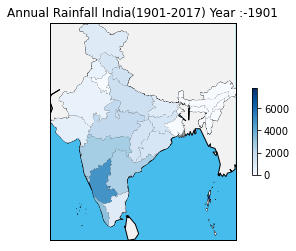

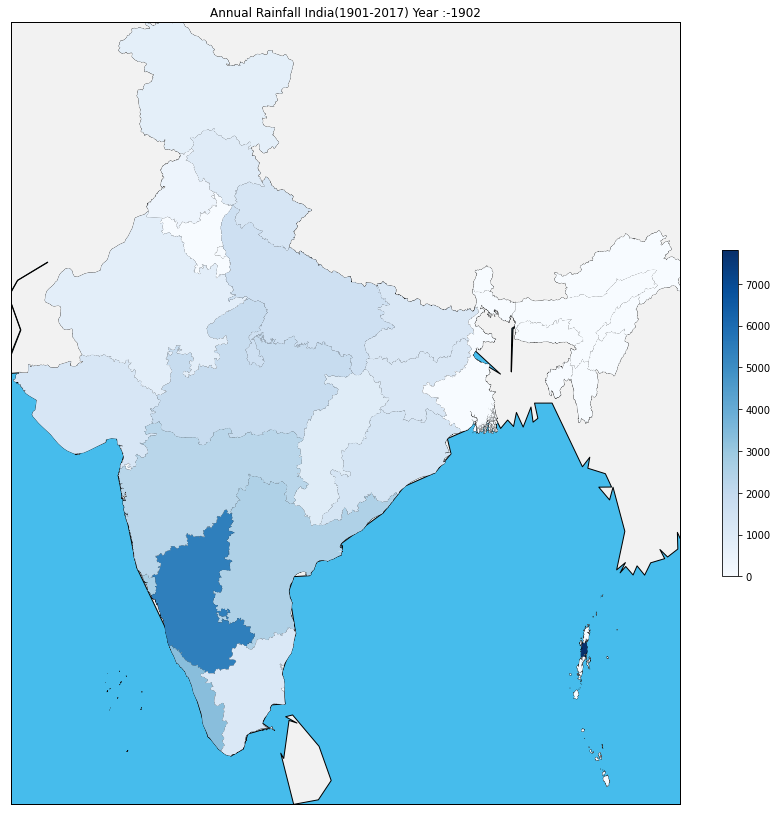

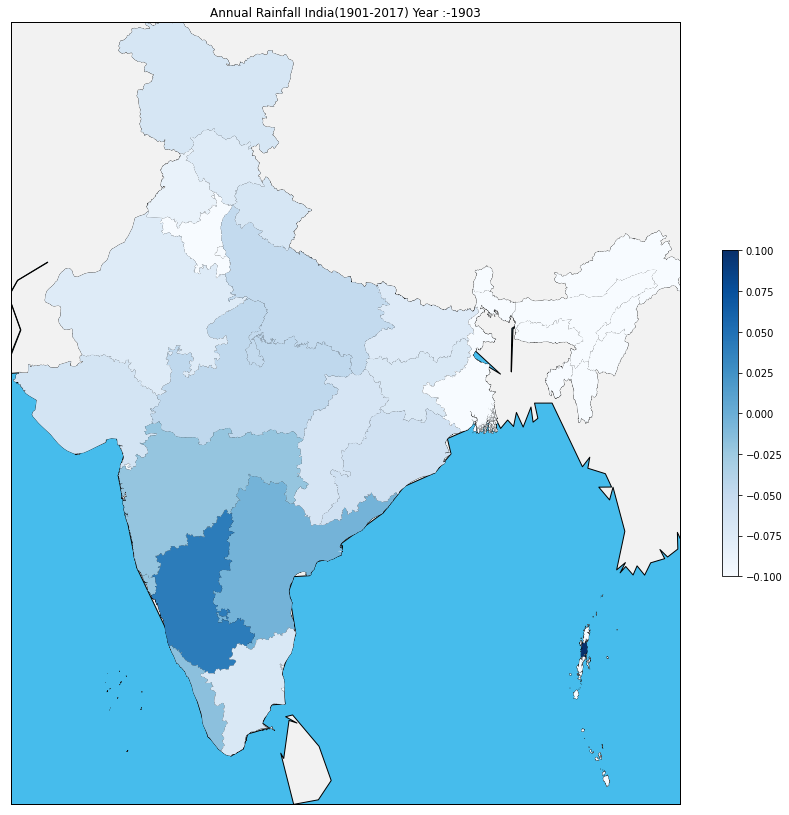

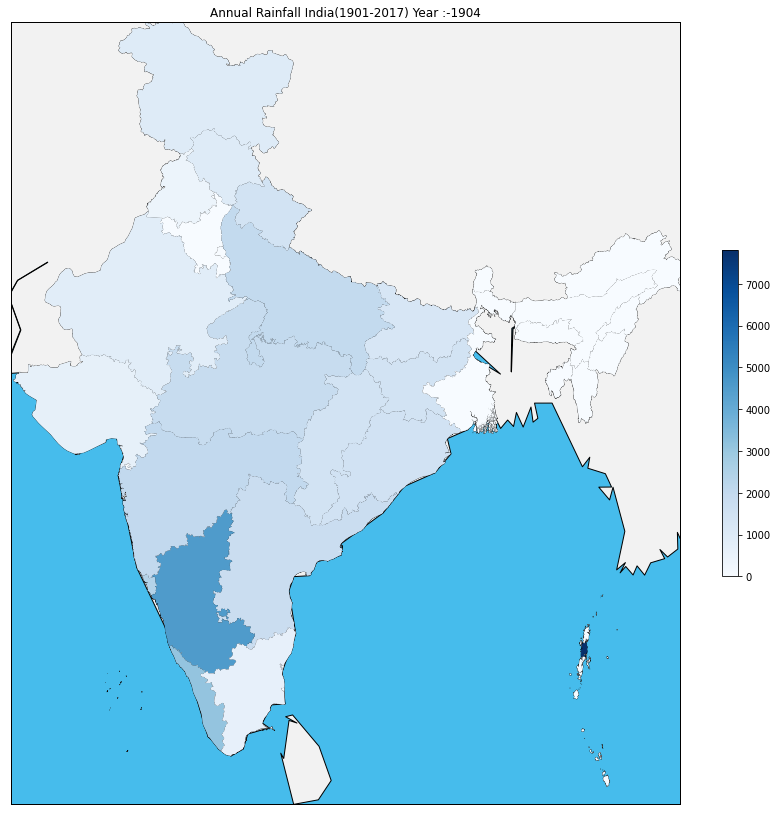

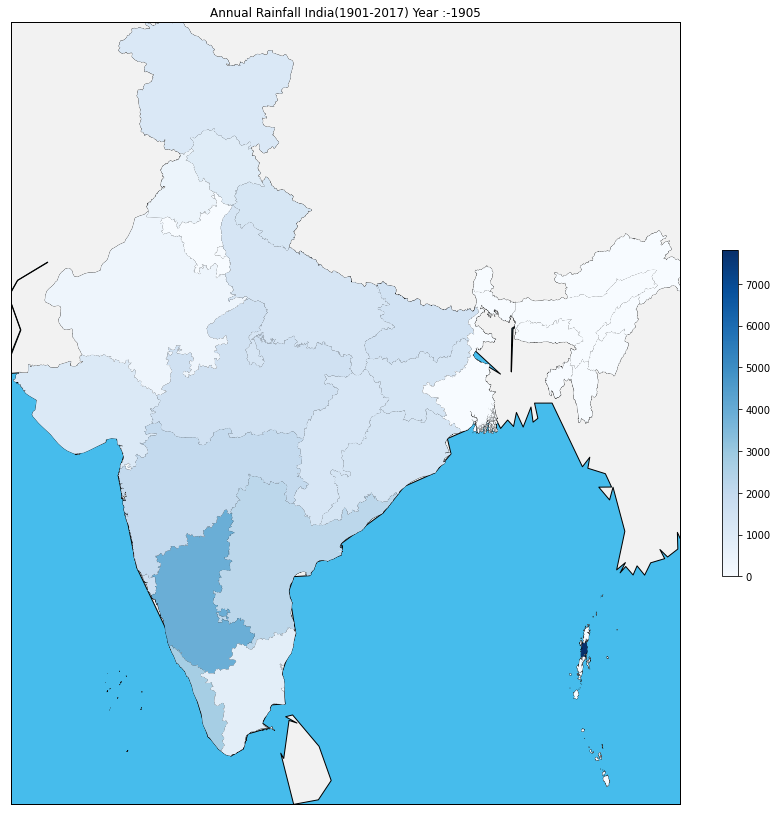

...

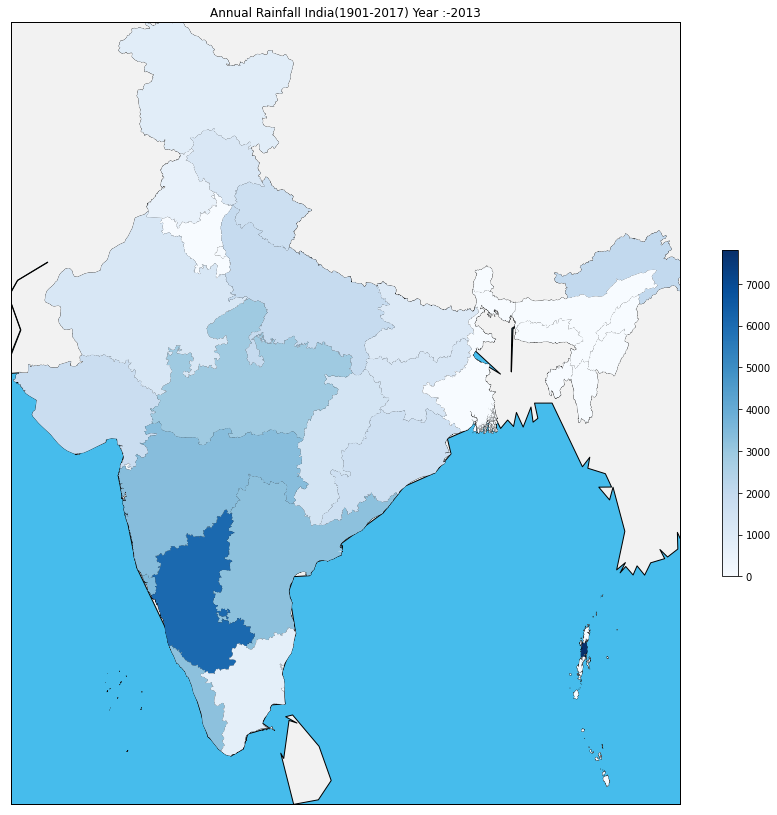

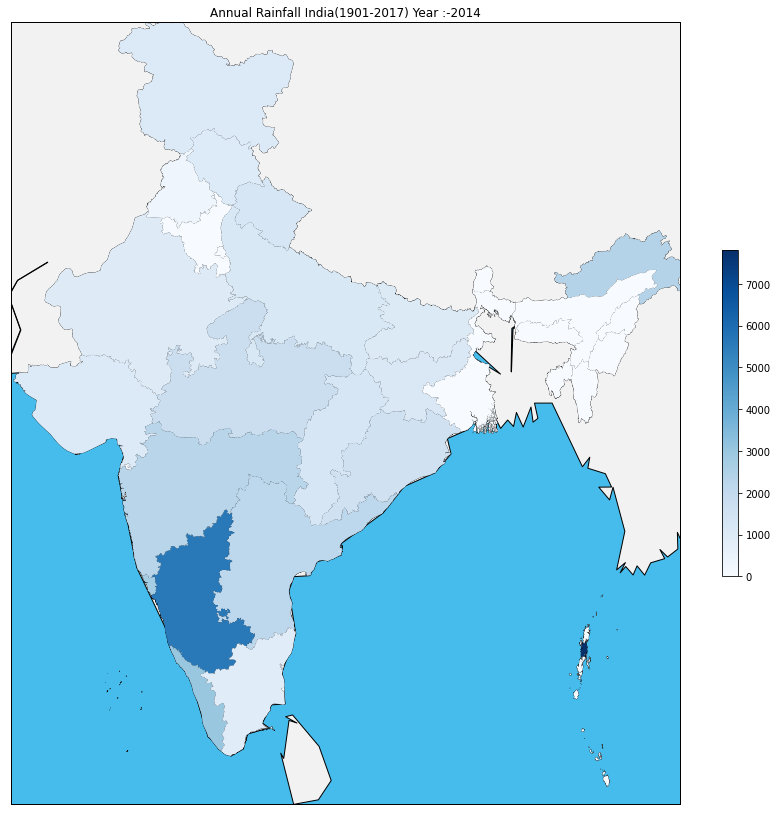

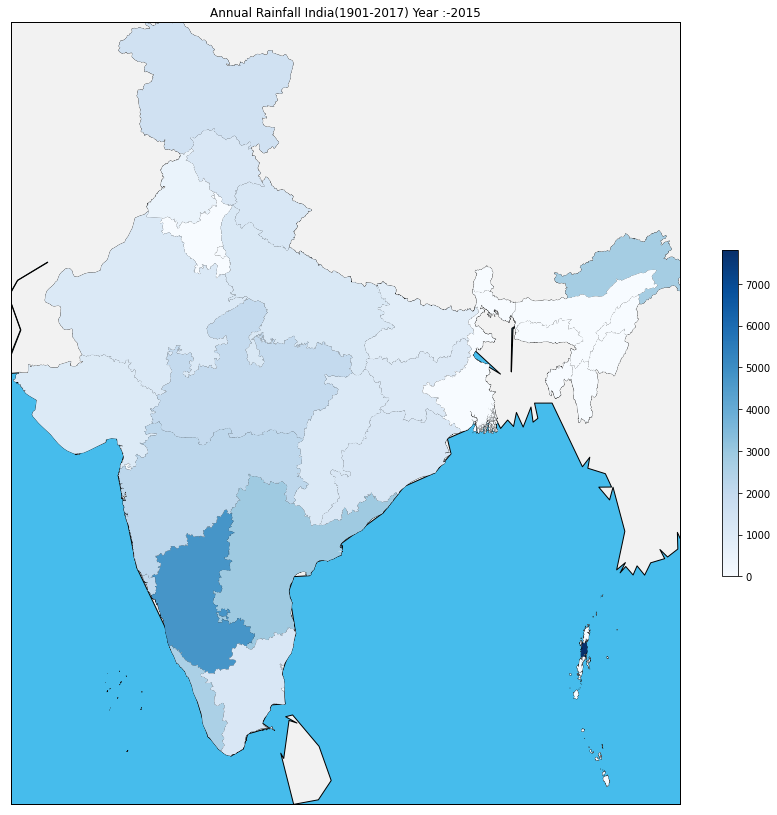

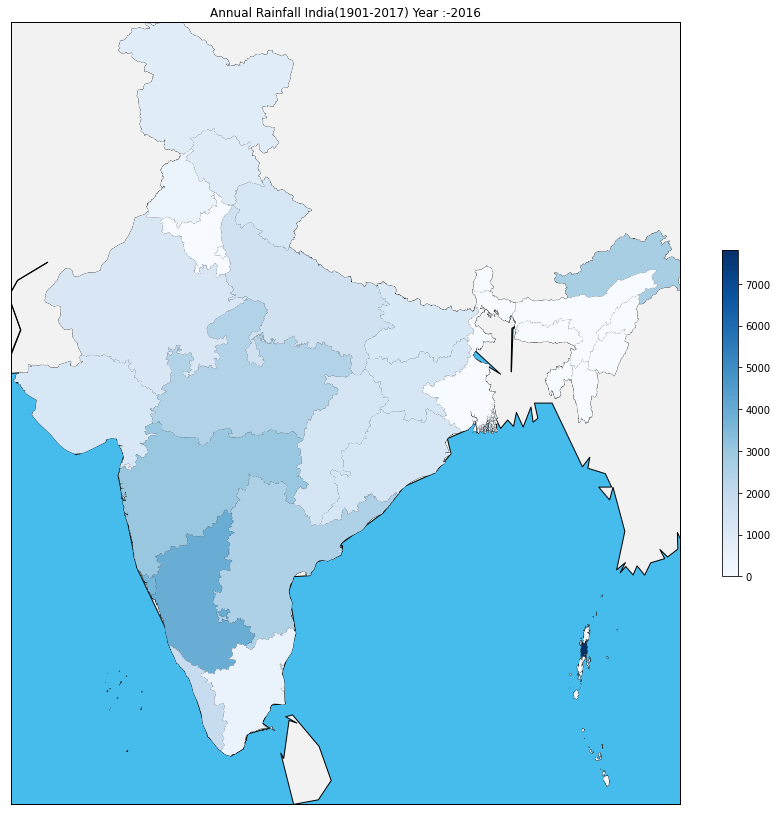

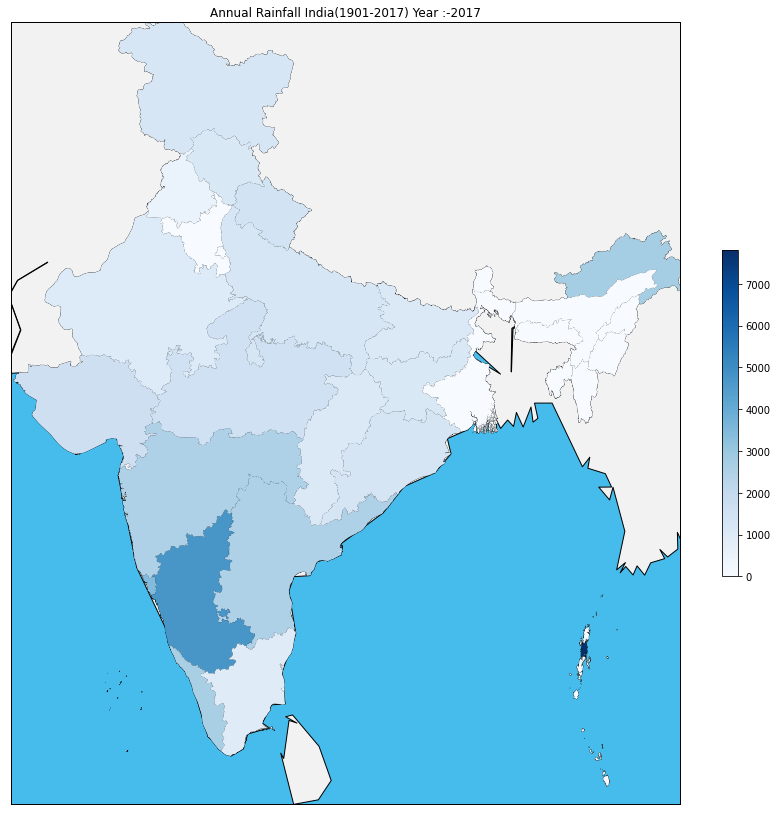

In [0]:
kwargs_write = {'fps':1.0, 'quantizer':'nq'}
imageio.mimsave('./powers.gif',[ haha(i) for i in range(1901,2018)] , fps=5)